In [16]:
import pandas as pd
import numpy as np

from datetime import datetime, timedelta

import statsmodels.api as sm
from statsmodels.graphics.api import qqplot
import matplotlib.pyplot as plt
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.nonparametric.smoothers_lowess import lowess

from sklearn.metrics import mean_squared_error, mean_absolute_error

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

import warnings
warnings.filterwarnings('ignore')

In [4]:
cols = ["year", "month", "frac_date", "mean_spots", "mean_std", "observations", "definitive"]
data = pd.read_csv("SN_m_tot_V2.0.csv", delimiter=';', names = cols,)
#data.to_csv("sunspot_data", index = False)
samp = data.copy()
data.head(10)

,year,month,frac_date,mean_spots,mean_std,observations,definitive
0,1749,1,1749.042,96.7,-1.0,-1,1
1,1749,2,1749.123,104.3,-1.0,-1,1
2,1749,3,1749.204,116.7,-1.0,-1,1
3,1749,4,1749.288,92.8,-1.0,-1,1
4,1749,5,1749.371,141.7,-1.0,-1,1
5,1749,6,1749.455,139.2,-1.0,-1,1
6,1749,7,1749.538,158.0,-1.0,-1,1
7,1749,8,1749.623,110.5,-1.0,-1,1
8,1749,9,1749.707,126.5,-1.0,-1,1
9,1749,10,1749.790,125.8,-1.0,-1,1


In [5]:
#function to convert astronomical dates to daily date format
def fraction_year_to_date(fractional_year):
    # Extracting the year
    year = int(fractional_year)

    # Calculating the remaining fractional part as days
    remaining_fraction = fractional_year - year
    days_in_year = 365 + int(year % 4 == 0 and (year % 100 != 0 or year % 400 == 0))  # Account for leap year

    # Converting the fractional part to equivalent date
    total_days = int(remaining_fraction * days_in_year)
    
    # Creating a base date for the year
    base_date = datetime(year, 1, 1)
    
    # Calculating the target date
    target_date = base_date + timedelta(days=total_days)

    return target_date.strftime("%d-%m-%Y")

#an example
fractional_year = 1749.042
result_date = fraction_year_to_date(fractional_year)
print(f'The date for {fractional_year} is: {result_date}')


The date for 1749.042 is: 16-01-1749


In [6]:
dates = list(map(fraction_year_to_date, samp["frac_date"]))
samp.insert(3,"dates",dates)
samp.head()

,year,month,frac_date,dates,mean_spots,mean_std,observations,definitive
0,1749,1,1749.042,16-01-1749,96.7,-1.0,-1,1
1,1749,2,1749.123,14-02-1749,104.3,-1.0,-1,1
2,1749,3,1749.204,16-03-1749,116.7,-1.0,-1,1
3,1749,4,1749.288,16-04-1749,92.8,-1.0,-1,1
4,1749,5,1749.371,16-05-1749,141.7,-1.0,-1,1


In [7]:
samp.drop(columns=['mean_std','observations', 'definitive'], inplace=True)

In [8]:
samp.head()

,year,month,frac_date,dates,mean_spots
0,1749,1,1749.042,16-01-1749,96.7
1,1749,2,1749.123,14-02-1749,104.3
2,1749,3,1749.204,16-03-1749,116.7
3,1749,4,1749.288,16-04-1749,92.8
4,1749,5,1749.371,16-05-1749,141.7


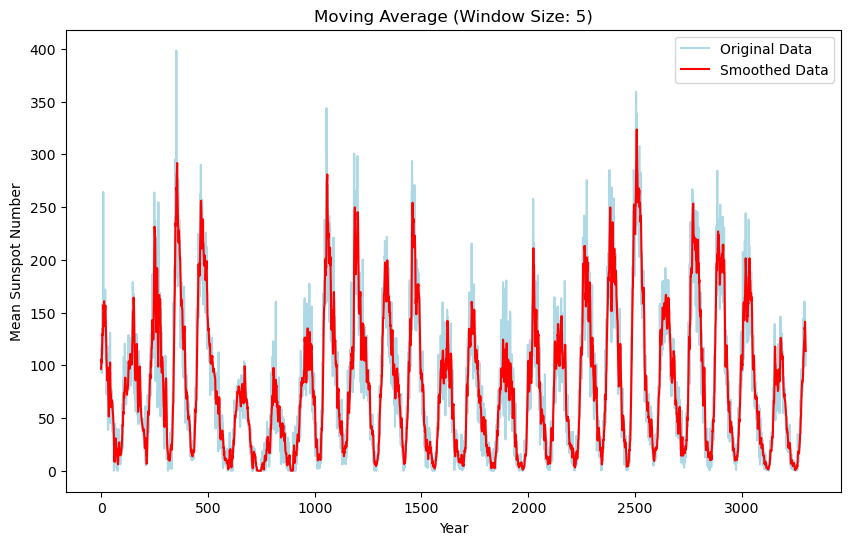

In [9]:
# Moving_average_animation
fig, ax = plt.subplots(figsize=(10, 6))

original_line = ax.plot(samp['mean_spots'], label='Original Data', color='lightblue')

ax.set_title('Moving Average Animation for Sunspot Data')
ax.set_xlabel('Year')
ax.set_ylabel('Mean Sunspot Number')
ax.legend()

# Function to update the plot for each window size
def update_plot(window_size):
    smoothed_data = samp['mean_spots'].rolling(window=window_size, min_periods=1).mean()
    smoothed_line.set_ydata(smoothed_data)
    ax.set_title(f'Moving Average (Window Size: {window_size})')

# Initialize the smoothed line with the first window size
smoothed_data_init = samp['mean_spots'].rolling(window=5, min_periods=1).mean()
smoothed_line, = ax.plot(smoothed_data_init, label='Smoothed Data', color='red')
ax.legend()

# Creating an animation
window_sizes = [5, 10, 12, 15, 20]  # Specify different window sizes
animation = FuncAnimation(fig, update_plot, frames=window_sizes, interval=1000)

HTML(animation.to_jshtml())

#animation.save('moving_average_animation.gif', writer='pillow', fps=1)

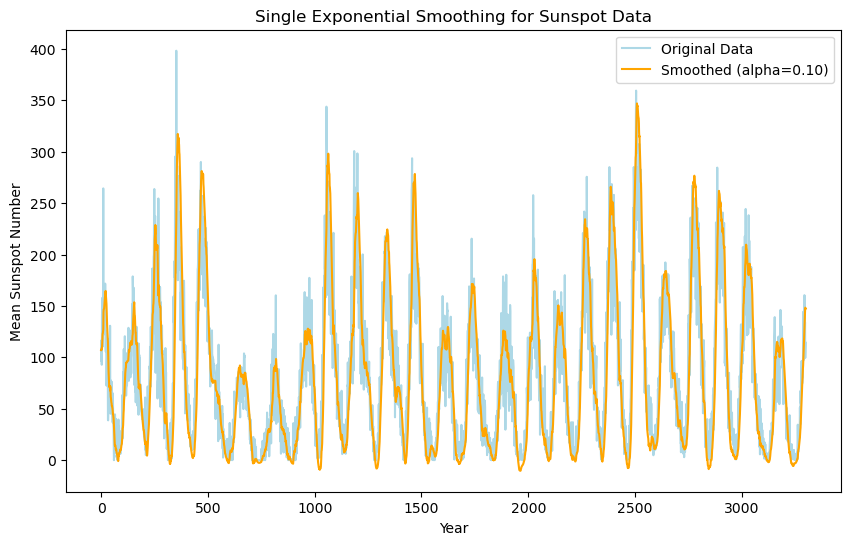

In [10]:
# Single_exp_smoothing_animation

fig, ax = plt.subplots(figsize=(10, 6))

def update_plot(constant):
    plt.cla()  # Clear the previous plot
    model = ExponentialSmoothing(samp['mean_spots'], trend='add', seasonal=None, initialization_method="estimated")
    result = model.fit(smoothing_level=constant)
    samp['Smoothed'] = result.fittedvalues
    
    plt.plot(samp.index, samp['mean_spots'], label='Original Data', color='lightblue')
    plt.plot(samp.index, samp['Smoothed'], label=f'Smoothed (alpha={constant:.2f})', color='orange')
    
    plt.title('Single Exponential Smoothing for Sunspot Data')
    plt.xlabel('Year')
    plt.ylabel('Mean Sunspot Number')
    plt.legend()

constants = np.arange(0.1, 1.1, 0.1)
animation = FuncAnimation(plt.gcf(), update_plot, frames=constants, interval=1000)

HTML(animation.to_jshtml())

#animation.save('single_exp_smoothing_animation.gif', writer='pillow', fps=1)


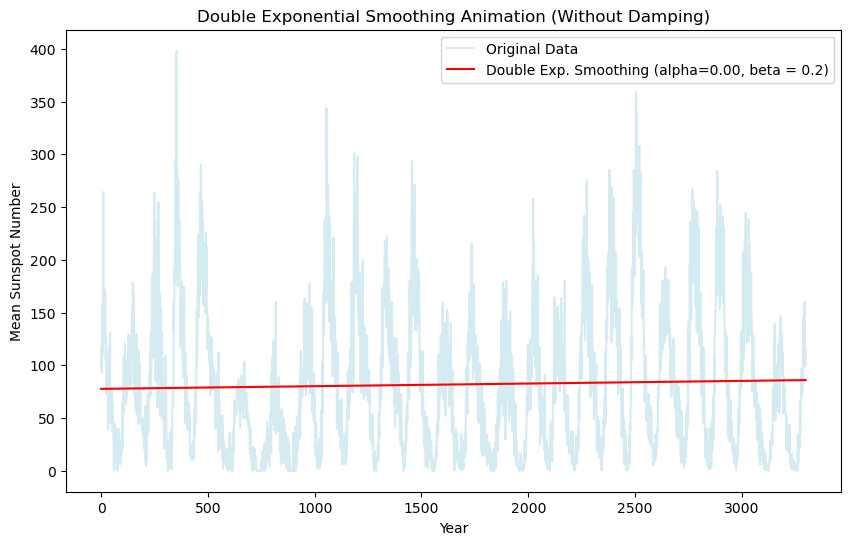

In [11]:
# Double_exp_smooth_no_damping_animation

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(samp['mean_spots'], label='Original Data')
ax.set_title('Double Exponential Smoothing Animation (Without Damping)')
ax.set_xlabel('Year')
ax.set_ylabel('Mean Sunspot Number')
ax.legend()

def update(frame):
    ax.clear()
    alpha = frame / 100.0  # Adjust the range of alpha as needed
    beta = 0.2  # You can adjust beta as needed

    model_double_exp = ExponentialSmoothing(samp['mean_spots'], trend='add', seasonal=None)
    result_double_exp = model_double_exp.fit(smoothing_level=alpha, smoothing_trend=beta)
    samp['Double_Exp_Smooth'] = result_double_exp.fittedvalues

    ax.plot(samp['mean_spots'], label='Original Data', color='lightblue', alpha=0.5)
    ax.plot(samp['Double_Exp_Smooth'], label=f'Double Exp. Smoothing (alpha={alpha:.2f}, beta = 0.2)', color='red')
    ax.set_title('Double Exponential Smoothing Animation (Without Damping)')
    ax.set_xlabel('Year')
    ax.set_ylabel('Mean Sunspot Number')
    ax.legend()


animation = FuncAnimation(fig, update, frames=np.arange(0, 101, 5), interval=500)

#animation.save('double_exp_smooth_no_damping_animation.gif', writer='pillow')


HTML(animation.to_jshtml())


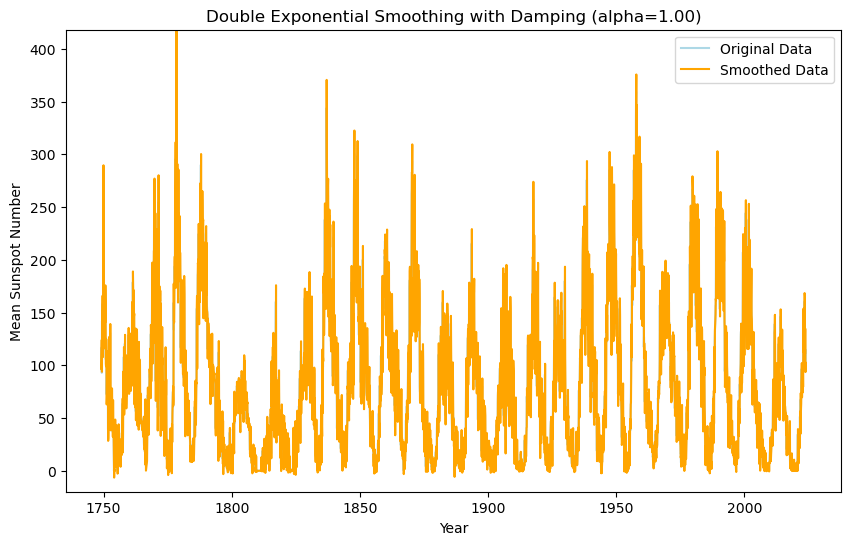

In [13]:
# Double_exp_smoothing_damping_animation

fig, ax = plt.subplots(figsize=(10, 6))
line_original, = ax.plot(samp['frac_date'], samp['mean_spots'], label='Original Data', color='lightblue')
line_smoothed, = ax.plot([], [], label='Smoothed Data', color='orange')
ax.set_title('Double Exponential Smoothing with Damping')
ax.set_xlabel('Year')
ax.set_ylabel('Mean Sunspot Number')
ax.legend()

def update(frame):
    alpha = frame/ 100.0  # Adjust the step size for different values of alpha
    beta = 0.2  # Smoothing parameter for trend
    phi = 0.9  # Damping factor

    model_double_exp = ExponentialSmoothing(samp['mean_spots'], trend='add', seasonal=None, damped_trend=True)
    result_double_exp = model_double_exp.fit(smoothing_level=alpha, smoothing_trend=beta, damping_trend=phi)

    samp['Double_Exp_Smooth'] = result_double_exp.fittedvalues

    line_smoothed.set_data(samp['frac_date'], samp['Double_Exp_Smooth'])
    ax.set_title(f'Double Exponential Smoothing with Damping (alpha={alpha:.2f})')
    
    return line_smoothed,

num_frames =np.arange(0, 101, 5) 

animation = FuncAnimation(fig, update, frames=num_frames, interval=500, blit=True)

#animation.save('double_exp_smoothing_damping_animation.gif', writer='pillow')

HTML(animation.to_jshtml())


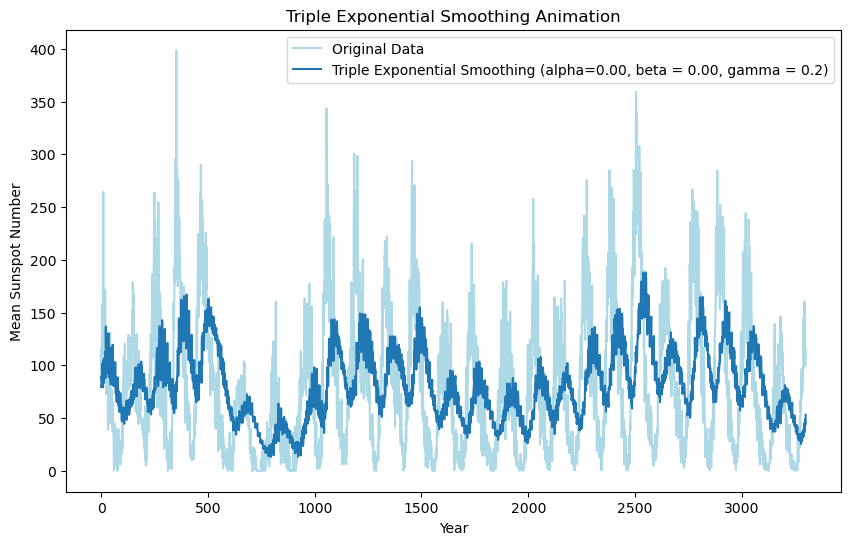

In [17]:
#Triple_exponential_smoothing_animation
# Doesn't works properly as the dataset has seasonality

alpha = 0.2  # Smoothing parameter for level
beta = 0.2   # Smoothing parameter for trend
gamma = 0.2  # Smoothing parameter for seasonality

def update_plot(frame):
    alpha = frame / 100.0  
    model = ExponentialSmoothing(samp['mean_spots'], trend='add', seasonal='add', seasonal_periods=12)
    result = model.fit(smoothing_level=alpha, smoothing_trend=alpha, smoothing_seasonal=gamma)
    samp['Triple_Exp_Smooth'] = result.fittedvalues
    
    ax.clear()
    ax.plot(samp.index, samp['mean_spots'], label='Original Data',color='lightblue')
    ax.plot(samp.index, samp['Triple_Exp_Smooth'], label=f'Triple Exponential Smoothing (alpha={alpha:.2f}, beta = {alpha:.2f}, gamma = 0.2)')
    ax.set_title('Triple Exponential Smoothing Animation')
    ax.set_xlabel('Year')
    ax.set_ylabel('Mean Sunspot Number')
    ax.legend()

fig, ax = plt.subplots(figsize=(10, 6))
animation = FuncAnimation(fig, update_plot, frames=np.arange(0, 101, 10), interval=500)


#animation.save('triple_exponential_smoothing_animation.gif', writer='pillow')
HTML(animation.to_jshtml())
